In [29]:
import os
import matplotlib.pyplot as plt
from tifffile import imread

import cv2
import numpy as np
from skimage import color
from sklearn.decomposition import NMF
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import imageio
from skimage import color


In [30]:
def reinhard_normalization(source_image_path, target_image_path):
    source_image = imageio.imread(source_image_path)
    target_image = imageio.imread(target_image_path)

    # Convert source and target images to RGB if they are single-channel
    if source_image.ndim == 2:
        source_image = color.gray2rgb(source_image)
    if target_image.ndim == 2:
        target_image = color.gray2rgb(target_image)

    # Convert source and target images to LAB color space
    source_lab = color.rgb2lab(source_image)
    target_lab = color.rgb2lab(target_image)

    # Compute mean and standard deviation for each channel
    source_mean = np.mean(source_lab[:,:,1:], axis=(0,1))
    source_std = np.std(source_lab[:,:,1:], axis=(0,1))
    target_mean = np.mean(target_lab[:,:,1:], axis=(0,1))
    target_std = np.std(target_lab[:,:,1:], axis=(0,1))

    # Perform normalization
    normalized_lab = np.zeros_like(source_lab)
    for i in range(2):
        normalized_lab[:,:,i] = (source_lab[:,:,i] - source_mean[i]) * (target_std[i] / source_std[i]) + target_mean[i]

    # Convert back to RGB color space
    normalized_rgb = color.lab2rgb(normalized_lab)

    return normalized_rgb


In [50]:
# Replace 'source_image.tif' and 'target_image.tif' with your TIFF image paths
normalized_image = reinhard_normalization('./archive/Images/ytma12_010804_benign2_ccd.tif','./archive/Images/ytma10_010704_benign1_ccd.tif')

# Save or display the normalized image
imageio.imwrite('./StainNormalization/normalized_image.tif', normalized_image)


In [26]:
def plot_tif_images(folder_path):
    tif_files = [file for file in os.listdir(folder_path) if (file.endswith('.TIF') or file.endswith('.tif'))]

    for tif_file in tif_files:
        file_path = os.path.join(folder_path, tif_file)

        # Read TIFF image using imageio
        image = imageio.imread(file_path)

        plt.imshow(image, cmap='gray')
        plt.title(tif_file)
        plt.axis('off')
        plt.show()


In [33]:
image_list = [file for file in os.listdir('./archive/Images') if (file.endswith('.TIF') or file.endswith('.tif'))]
pth = './archive/Images/'
pth1 = './archive/Normalized/'

In [85]:
for i in range(0 ,len(image_list)):
    #target_im = cv2.imread()
    #input_im = cv2.imread()
    n = reinhard_normalization(pth + image_list[i],pth + image_list[3])
    imageio.imwrite(pth1+"normalized_"+image_list[i], n)
    

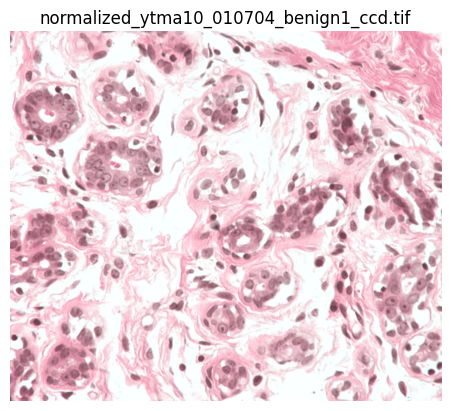

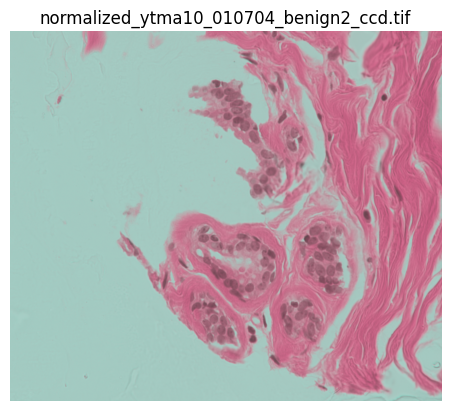

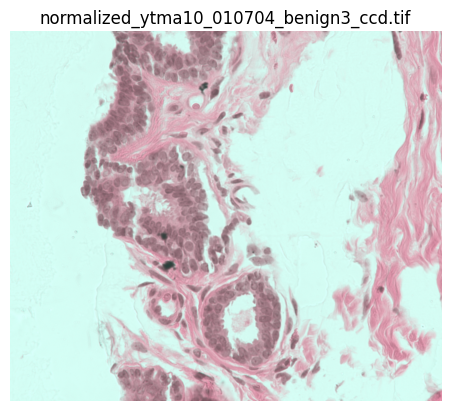

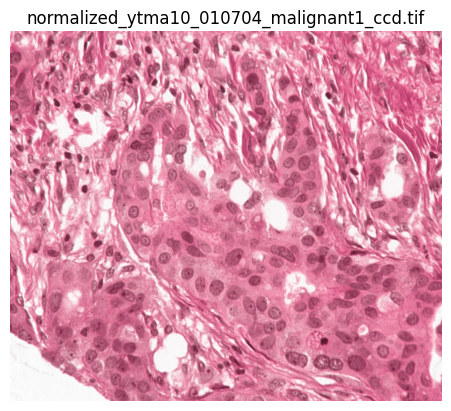

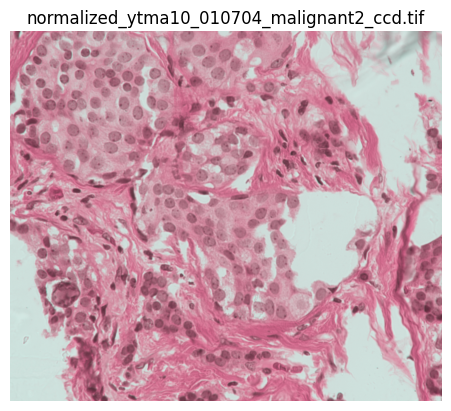

...

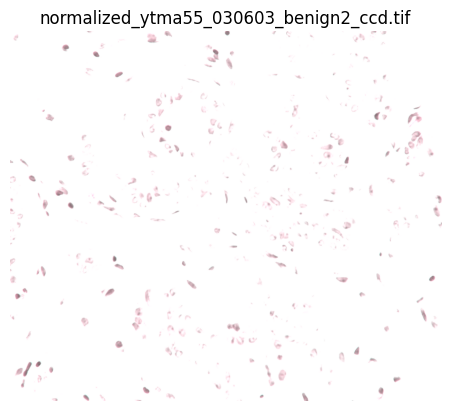

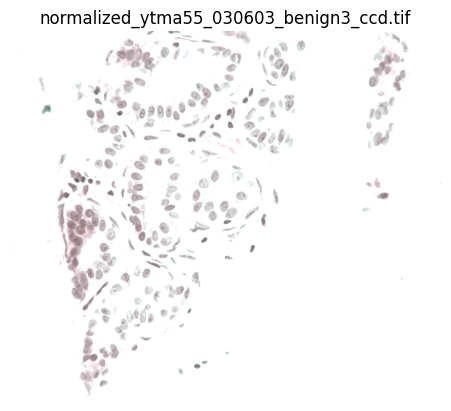

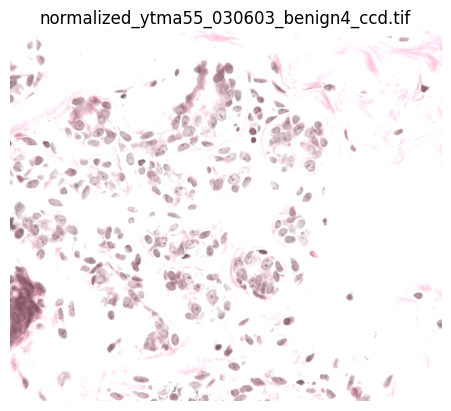

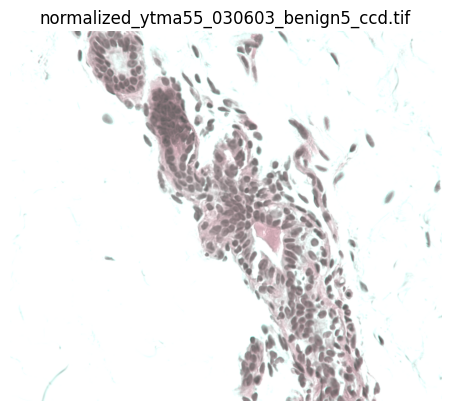

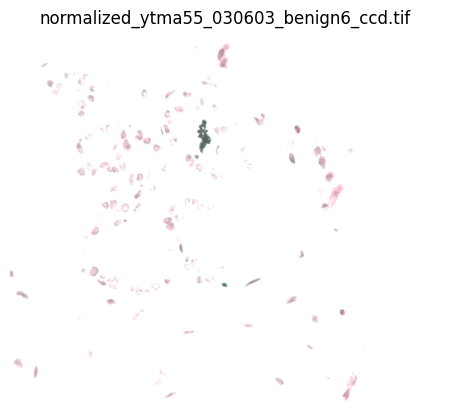

In [86]:
plot_tif_images("./archive/Normalized")